<a href="https://colab.research.google.com/github/darkknightxi/mango-lens/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 KB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 34.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 KB 30.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 KB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.9/132.9 KB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 31.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

In [ ]:
ims = search_images_ddg('alphonso mango')
len(ims)

200

In [ ]:
dest = 'images/alphonso.jpg'
download_url(ims[0], dest)

Path('images/alphonso.jpg')

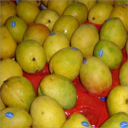

In [ ]:
im = Image.open(dest)
im.to_thumb(128,128)

In [ ]:
mango_types = 'alphonso','dasheri','kesar'
m_path = Path('Mangoes')

In [ ]:
if not m_path.exists():
    m_path.mkdir()
    for o in mango_types:
        dest = (m_path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_ddg(f'{o} mango')
        download_images(dest, urls=results)

In [ ]:
fns = get_image_files(m_path)
fns

(#554) [Path('Mangoes/kesar/c6c1f4db-9f28-4e62-92eb-6301b19e915a.jpg'),Path('Mangoes/kesar/c6566c0e-07e3-40cc-9122-09978516006d.png'),Path('Mangoes/kesar/4ae8767f-ccb5-4ba7-829e-9fba12c6c5b9.jpg'),Path('Mangoes/kesar/d0d52967-5ce6-43f3-94a0-cf85917126cb.jpg'),Path('Mangoes/kesar/a437b059-c86d-4730-8790-64402864edb1.jpg'),Path('Mangoes/kesar/c7e77666-3d49-4fac-98de-c4db64726785.jpg'),Path('Mangoes/kesar/9f588ddd-258f-4b61-9dd7-510080a30d7f.jpg'),Path('Mangoes/kesar/892d0811-f6cb-406a-9c06-607c5b5c0b08.jpg'),Path('Mangoes/kesar/3eafe1af-9f2a-47ee-ac05-7237d45b4db2.jpg'),Path('Mangoes/kesar/f69c65cd-bda5-4b12-be88-508f18614d43.jpg')...]

In [ ]:
failed = verify_images(fns)
failed

(#13) [Path('Mangoes/kesar/b1e69509-a36b-4bb7-9363-9657f363f552.jpg'),Path('Mangoes/kesar/fb402b9b-cb67-4fde-995a-9c1137a416d3.png'),Path('Mangoes/kesar/f4a154d3-6b21-49d3-b123-5124b2c51b1d.jpg'),Path('Mangoes/alphonso/f8201be7-d9d6-4533-a34c-ac9fd60512b0.JPG'),Path('Mangoes/alphonso/07452cc1-4e01-43a4-81c4-4fa313d4ec62.jpeg'),Path('Mangoes/alphonso/3a07adf1-cec8-40cc-9b8e-aa292fba924b.jpg'),Path('Mangoes/alphonso/fbef4a5f-c5cd-44ce-8d4b-d9854d40319a.jpg'),Path('Mangoes/alphonso/f1788984-74dd-4064-940f-9a9016bf7e09.jpg'),Path('Mangoes/alphonso/90a50957-e367-49d5-bb29-0c0c1c1c1957.jpg'),Path('Mangoes/alphonso/b16241b8-3c48-4621-82a0-e27641d62b20.jpg')...]

In [ ]:
failed.map(Path.unlink);

In [ ]:
mangoes = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
dls = mangoes.dataloaders(m_path)

In [ ]:
mangoes = mangoes.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)
dls = mangoes.dataloaders(m_path)

In [ ]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.681926,1.076918,0.429907,01:37


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/pytho

epoch,train_loss,valid_loss,error_rate,time
0,1.300229,0.882767,0.317757,02:06
1,1.179444,0.958027,0.327103,02:05
2,1.021370,1.000719,0.289720,02:14
3,0.945762,1.016591,0.299065,02:07


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
/usr/local/lib/python3.9/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._

/usr/local/lib/python3.9/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
/usr/local/lib/python3.9/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f29ca228f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._

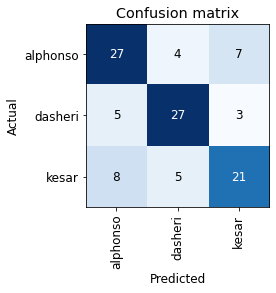

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

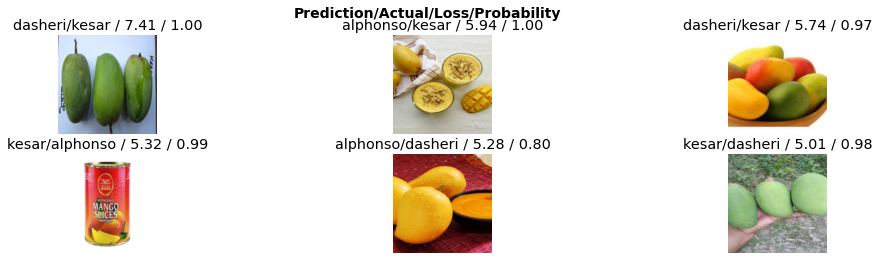

In [ ]:
interp.plot_top_losses(6, nrows=2, figsize=(17,4))

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.9/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.9/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx, cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), m_path/cat)

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts = '.pkl')

(#1) [Path('export.pkl')]

In [ ]:
#|default_exp app

In [ ]:
#|export
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('images/alphonso.jpg')

('alphonso', TensorBase(0), TensorBase([0.9479, 0.0119, 0.0402]))

In [ ]:
learn_inf.dls.vocab

['alphonso', 'dasheri', 'kesar']

In [ ]:
#|export
categories = ('alphonso', 'dasheri', 'kesar')

def classify_image(img):
  pred,idx,probs = learn.predict(img)
  return dict(zip(categories, map(float, probs)))

In [ ]:
classify_image('images/alphonso.jpg')

{'alphonso': 0.9479278922080994,
 'dasheri': 0.011900443583726883,
 'kesar': 0.04017171263694763}

In [ ]:
pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#|export
from fastai.vision.all import *
import gradio as gr

In [ ]:
#|export
image = gr.inputs.Image(shape=(192,192))
label = gr.outputs.Label()

intf = gr.Interface(fn=classify_image, inputs=image, outputs=label)
intf.launch(inline=False, share=True)

/usr/local/lib/python3.9/dist-packages/gradio/inputs.py:257: UserWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/gradio/deprecation.py:40: UserWarning: `optional` parameter is deprecated, and it has no effect
  warnings.warn(value)
/usr/local/lib/python3.9/dist-packages/gradio/outputs.py:197: UserWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/gradio/deprecation.py:40: UserWarning: The 'type' parameter has been deprecated. Use the Number component instead.
  warnings.warn(value)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://9bb68c2f95748ddb30.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces
